In [24]:
import os
import warnings
warnings.filterwarnings('ignore')
import pandas as pd
import matplotlib.pyplot as plt

from IPython.display import set_matplotlib_formats
set_matplotlib_formats("retina")

import seaborn as sns
sns.set()
sns.set(rc={"figure.figsize": (14.7, 10.27)})

from plotly import tools
from plotly.offline import iplot
import plotly.graph_objs as go
import gc

from datetime import datetime
from prophet import Prophet
from prophet.diagnostics import cross_validation, performance_metrics
from prophet.plot import plot_cross_validation_metric

In [28]:
file_to_get = "Coinbase_BTCUSD_1h.csv"
if not os.path.exists(f"./data/{file_to_get}"):
  !wget -O ./data/{file_to_get} https://raw.githubusercontent.com/lilstipher/daily-cryptocurrencies-data/master/{file_to_get}
    
!ls -l

--2022-09-02 10:09:02--  https://raw.githubusercontent.com/lilstipher/daily-cryptocurrencies-data/master/Coinbase_BTCUSD_1h.csv
Resolving raw.githubusercontent.com (raw.githubusercontent.com)... 185.199.108.133, 185.199.110.133, 185.199.109.133, ...
Connecting to raw.githubusercontent.com (raw.githubusercontent.com)|185.199.108.133|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 2499381 (2,4M) [text/plain]
Saving to: ‘./data/Coinbase_BTCUSD_1h.csv’

./data/Coinbase_BTC 100%[===================>]   2,38M  7,12MB/s    in 0,3s    

2022-09-02 10:09:02 (7,12 MB/s) - ‘./data/Coinbase_BTCUSD_1h.csv’ saved [2499381/2499381]

total 39912
-rw-r--r--   1 clement  staff   2499381 Sep  1 22:29 Coinbase_BTCUSD_1h.csv
-rw-r--r--   1 clement  staff  17932167 Sep  1 22:40 bitcoin-prediction.ipynb
drwxr-xr-x   5 clement  staff       160 Sep  2 10:09 data
drwxr-xr-x  10 clement  staff       320 Sep  1 22:37 env


In [4]:
bitcoin_usd_data = pd.read_csv(file_to_get, skiprows=[0])
bitcoin_usd_data.info()
bitcoin_usd_data.sample(5)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 29061 entries, 0 to 29060
Data columns (total 9 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   Unix Timestamp  29061 non-null  float64
 1   Date            29061 non-null  object 
 2   Symbol          29061 non-null  object 
 3   Open            29061 non-null  float64
 4   High            29061 non-null  float64
 5   Low             29061 non-null  float64
 6   Close           29061 non-null  float64
 7   Volume BTC      29061 non-null  float64
 8   Volume USD      29061 non-null  float64
dtypes: float64(7), object(2)
memory usage: 2.0+ MB


,Unix Timestamp,Date,Symbol,Open,High,Low,Close,Volume BTC,Volume USD
26601,1.507774e+09,2017-10-11 10-PM,BTCUSD,4832.05,4849.99,4831.00,4849.80,551.14,2669096.16
17238,1.541466e+09,2018-11-06 01-AM,BTCUSD,6406.18,6409.00,6403.00,6407.14,123.07,788484.26
18777,1.535926e+09,2018-09-02 10-PM,BTCUSD,7285.00,7293.28,7270.00,7278.32,184.53,1343734.05
6037,1.581790e+09,2020-02-15 06-PM,BTCUSD,9835.29,9912.19,9801.81,9910.22,913.15,9008219.74
17871,1.539187e+09,2018-10-10 04-PM,BTCUSD,6493.48,6507.90,6490.84,6507.53,207.59,1349829.73


In [5]:
bitcoin_usd_data["Datetime"] = bitcoin_usd_data["Unix Timestamp"].apply(lambda x: datetime.fromtimestamp(x))
bitcoin_usd_data

,Unix Timestamp,Date,Symbol,Open,High,Low,Close,Volume BTC,Volume USD,Datetime
0,1.603523e+09,2020-10-24 07-AM,BTCUSD,12965.84,12965.84,12953.20,12953.20,0.00,0.00,2020-10-24 09:00:00
1,1.603519e+09,2020-10-24 06-AM,BTCUSD,12979.28,12991.89,12961.03,12965.84,122.39,1587965.94,2020-10-24 08:00:00
2,1.603516e+09,2020-10-24 05-AM,BTCUSD,12981.77,12984.11,12947.58,12979.28,146.83,1904157.46,2020-10-24 07:00:00
3,1.603512e+09,2020-10-24 04-AM,BTCUSD,12983.84,13014.09,12970.48,12981.77,188.07,2443428.21,2020-10-24 06:00:00
4,1.603508e+09,2020-10-24 03-AM,BTCUSD,12998.90,13026.43,12972.18,12983.84,285.76,3715214.25,2020-10-24 05:00:00
...,...,...,...,...,...,...,...,...,...,...
29056,1.498921e+09,2017-07-01 03-PM,BTCUSD,2459.35,2475.00,2450.00,2467.83,276.82,682105.41,2017-07-01 17:00:00
29057,1.498918e+09,2017-07-01 02-PM,BTCUSD,2454.43,2473.93,2450.83,2459.35,289.42,712864.80,2017-07-01 16:00:00
29058,1.498914e+09,2017-07-01 01-PM,BTCUSD,2488.43,2488.43,2454.40,2454.43,280.28,693254.01,2017-07-01 15:00:00
29059,1.498910e+09,2017-07-01 12-PM,BTCUSD,2509.17,2512.87,2484.99,2488.43,157.36,393142.50,2017-07-01 14:00:00


In [6]:
fig = go.Figure(data=[go.Candlestick(x=bitcoin_usd_data["Datetime"],
                                     open=bitcoin_usd_data["Open"],
                                     high=bitcoin_usd_data["High"],
                                     low=bitcoin_usd_data["Low"],
                                     close=bitcoin_usd_data["Close"])])
fig.update_layout(xaxis_rangeslider_visible=False)
fig.show()

In [7]:
# calc typical price indicator
bitcoin_usd_data["typical_price"] = (bitcoin_usd_data['Close'] +
                                     bitcoin_usd_data['High'] +
                                     bitcoin_usd_data['Low'])/3

In [8]:
g1 = go.Scatter(x=bitcoin_usd_data["Datetime"],
                y=bitcoin_usd_data["Open"],
                mode="lines",
                name="Open")

g2 = go.Scatter(x=bitcoin_usd_data["Datetime"],
                y=bitcoin_usd_data["Close"],
                mode="lines",
                name="Close")

g3 = go.Scatter(x=bitcoin_usd_data["Datetime"],
                y=bitcoin_usd_data["typical_price"],
                mode="lines",
                name="typical_price")

layout = {"title": "Historical Bitcoin Prices By hour (2017-2020)",
          "xaxis": {"rangeslider": {"visible": True},
                    "type": "date"}}

fig = {"data": [g1, g2, g3], "layout": layout}
iplot(fig)

In [9]:
# use prophet
# format data for prophet
df_model = bitcoin_usd_data.copy()
df_model = df_model[["Datetime", "typical_price"]]
df_model = df_model.rename(columns={"Datetime": "ds", "typical_price": "y"})
df_model

,ds,y
0,2020-10-24 09:00:00,12957.413333
1,2020-10-24 08:00:00,12972.920000
2,2020-10-24 07:00:00,12970.323333
3,2020-10-24 06:00:00,12988.780000
4,2020-10-24 05:00:00,12994.150000
...,...,...
29056,2017-07-01 17:00:00,2464.276667
29057,2017-07-01 16:00:00,2461.370000
29058,2017-07-01 15:00:00,2465.753333
29059,2017-07-01 14:00:00,2495.430000


In [15]:
model = Prophet()
model.fit(df_model)

Initial log joint probability = -439.928
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       64394.7     0.0469289         13951           1           1      127   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       69012.2     0.0332407       5134.92           1           1      239   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     299       70539.9     0.0503537       4372.62           1           1      357   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     399         72009      0.150117        7330.5           1           1      469   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     499       72674.1    0.00223619       1727.87           1           1      584   
    Iter      log prob        ||dx||      ||grad||       alpha  

  73389.5    0.00687864        3010.5           1           1      696   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     699       74054.5    0.00533345       3381.48           1           1      818   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     799       74815.1      0.011008       4872.39           1           1      927   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     899       75058.7     0.0371636        6731.5           1           1     1041   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     999         75448     0.0527383       11094.3           1           1     1153   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1099       76069.3      0.083086       19032.1           1           1     1260   
    Iter      log prob        |

In [16]:
period_in_hours = 24*30
future = model.make_future_dataframe(periods=period_in_hours, freq="H")
forecast = model.predict(df=future)

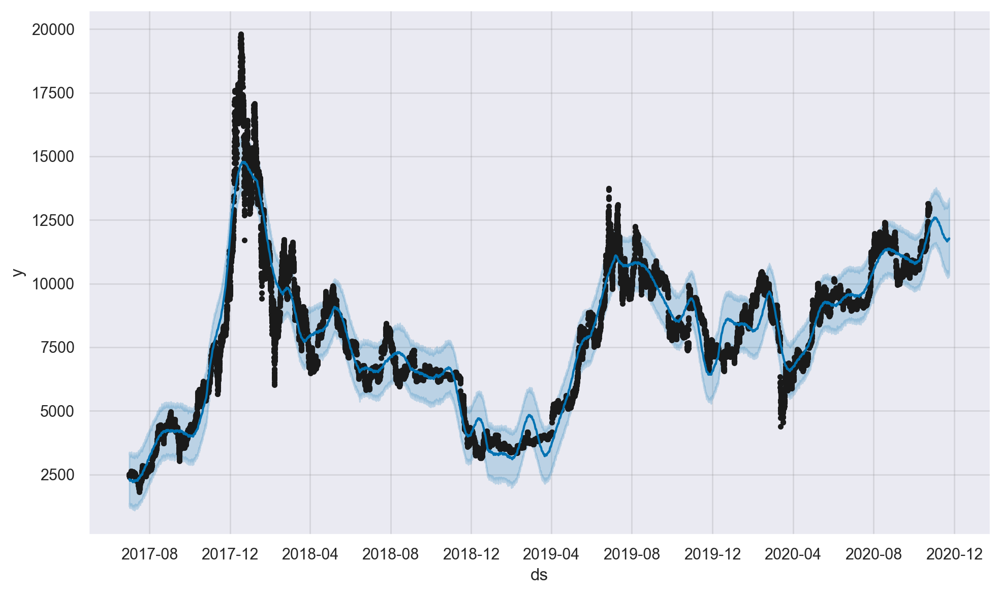

In [26]:
_ = model.plot(forecast)

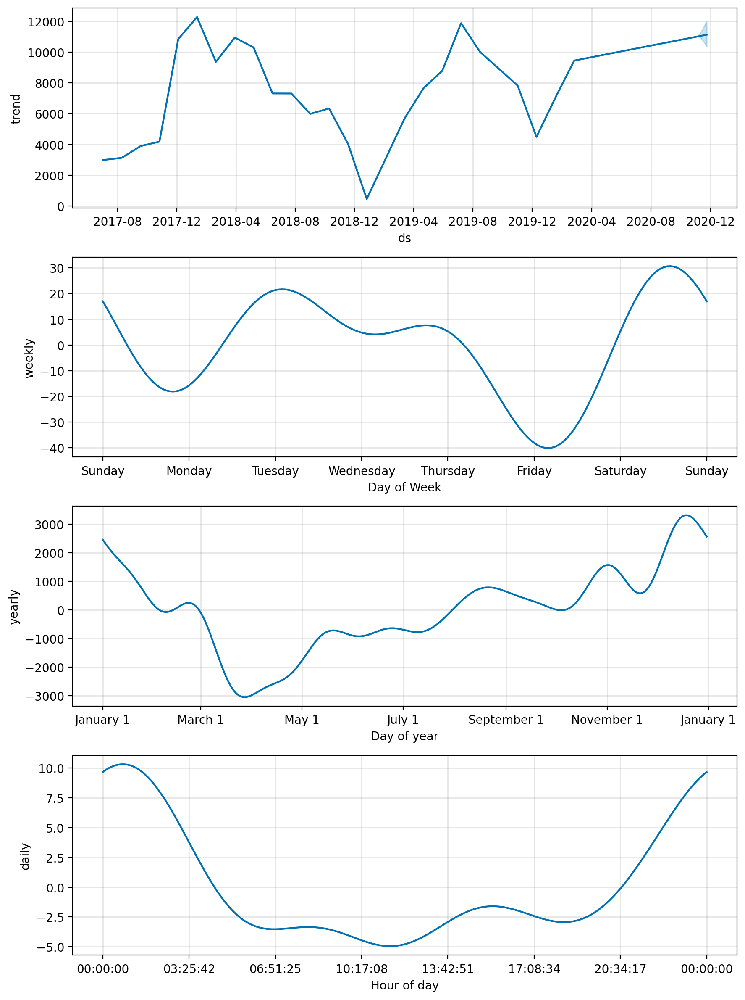

In [18]:
_ = model.plot_components(forecast)

In [19]:
# cross validation
cross_validation_df = cross_validation(model, initial="366 days", period="90 days", horizon="90 days")

INFO:prophet:Making 9 forecasts with cutoffs between 2018-08-06 09:00:00 and 2020-07-26 09:00:00


  0%|          | 0/9 [00:00<?, ?it/s]

Initial log joint probability = -243.269
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       28021.9      0.112399       1760.97      0.2715           1      124   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       28346.8     0.0282174       3876.08           1           1      230   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     299       28460.6     0.0973159       5789.58           1           1      345   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     399       28585.6      0.164873       4644.37           1           1      456   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     499       28614.3    0.00140676        159.22           1           1      572   
    Iter      log prob        ||dx||      ||grad||       alpha  

Initial log joint probability = -302.534
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       34797.3     0.0134978        1247.1           1           1      121   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199         34896    0.00167717       1212.32      0.2832      0.2832      228   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     299       34950.8     0.0084832       927.006           1           1      346   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     399       34970.2    0.00107155       1351.26           1           1      455   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     499       35042.5     0.0161643       1543.09      0.2422           1      566   
    Iter      log prob        ||dx||      ||grad||       alpha  

Initial log joint probability = -479.839
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       34639.3     0.0109674       8279.83           1           1      125   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       38362.5      0.203857       18965.4      0.8659      0.8659      239   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     299       39144.5      0.299092       17176.2           1           1      346   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     399       40417.6    0.00468077       3918.69           1           1      457   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     499       40583.9     0.0434454       4896.19           1           1      568   
    Iter      log prob        ||dx||      ||grad||       alpha  

Initial log joint probability = -366.985
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       44425.4     0.0147982        2352.7           1           1      121   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       47723.8     0.0479887       4827.72           1           1      230   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     299       48847.1     0.0142196       2879.13           1           1      339   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     399       49763.7      0.059071       16817.1       0.324       0.324      451   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     499       50734.3     0.0111522       6793.71           1           1      559   
    Iter      log prob        ||dx||      ||grad||       alpha  

Initial log joint probability = -367.986
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       49195.5     0.0467441       6084.76           1           1      118   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       52658.8     0.0464249       7604.77           1           1      226   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     299       53966.7     0.0294135       13491.1           1           1      336   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     399       54584.3    0.00306515       4742.11           1           1      443   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     499       55465.2      0.394153       8754.63           1           1      550   
    Iter      log prob        ||dx||      ||grad||       alpha  

Initial log joint probability = -386.18
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       53199.7     0.0443649       10645.8      0.3533           1      113   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       56058.9     0.0776437       7710.01      0.5223           1      223   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     299       57415.6     0.0261551        2298.7           1           1      328   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     399       58503.8      0.053706       7958.44           1           1      432   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     499       59471.4     0.0899466       6940.88           1           1      540   
    Iter      log prob        ||dx||      ||grad||       alpha   

Initial log joint probability = -406.112
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       60327.8     0.0306689       8327.05           1           1      120   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       64320.4     0.0110958       3134.93           1           1      232   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     299       65426.7      0.113111       15136.4      0.3635     0.03635      342   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     399       67491.1      0.194789       28415.5           1           1      454   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     499       68771.6     0.0230264       6679.94           1           1      563   
    Iter      log prob        ||dx||      ||grad||       alpha  

In [20]:
cross_validation_df.head()

,ds,yhat,yhat_lower,yhat_upper,y,cutoff
0,2018-08-06 10:00:00,7704.046260,7026.731860,8387.332400,6977.953333,2018-08-06 09:00:00
1,2018-08-06 11:00:00,7705.859870,7080.987628,8451.133967,6971.900000,2018-08-06 09:00:00
2,2018-08-06 12:00:00,7709.528660,7026.872792,8434.802594,6971.253333,2018-08-06 09:00:00
3,2018-08-06 13:00:00,7714.542649,7036.948371,8381.482858,6965.000000,2018-08-06 09:00:00
4,2018-08-06 14:00:00,7718.982089,6986.360854,8427.125173,6969.093333,2018-08-06 09:00:00


In [21]:
performance_metrics_df = performance_metrics(cross_validation_df)

In [22]:
performance_metrics_df.head()

,horizon,mse,rmse,mae,mape,mdape,smape,coverage
0,9 days 00:00:00,1.623381e+06,1274.119711,1060.785154,0.129065,0.109677,0.136150,0.411523
1,9 days 01:00:00,1.636114e+06,1279.106656,1065.659274,0.129639,0.110302,0.136805,0.409465
2,9 days 02:00:00,1.648989e+06,1284.129615,1070.583200,0.130219,0.111059,0.137464,0.407407
3,9 days 03:00:00,1.661597e+06,1289.029591,1075.491427,0.130804,0.111299,0.138125,0.405350
4,9 days 04:00:00,1.672956e+06,1293.427911,1080.133129,0.131371,0.111849,0.138762,0.402778


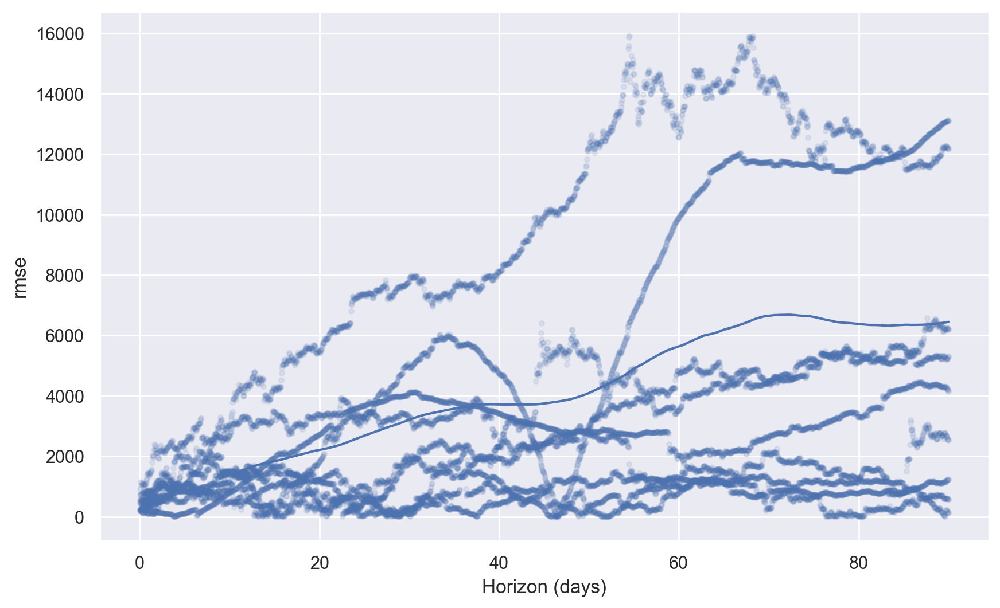

In [25]:
_ = plot_cross_validation_metric(cross_validation_df, metric="rmse")